In [87]:
import json
import pickle
import time
from datetime import datetime, timedelta
from itertools import product

import numpy as np
import pandas as pd

import seaborn as sns
import torch
import joblib
import os

import matplotlib.pyplot as plt
from tqdm import tqdm

# Local modules
import modularised_utils as mut
import opt_utils as oput
import evaluation_utils as evut
import Linear_Additive_Noise_Models as lanm
import operations as ops
import params

# Experiments set-up

In [88]:
experiment       = 'synth1'
abduction        = True
coeff_estimation = False

# Define the radius of the Wasserstein balls (epsilon, delta) and the size for both models.
#epsilon, delta           = params.radius[experiment]
#ll_num_envs, hl_num_envs = params.n_envs[experiment]

# Define the number of samples per environment. Currently every environment has the same number of samples
num_llsamples, num_hlsamples  = params.n_samples[experiment]

# Load ground truth abstraction
Tau = mut.load_T(experiment)

In [89]:
Dll_obs  = mut.load_samples(experiment)[None][0] 
Gll, Ill = mut.load_model(experiment, 'LL')
n_varsll = len(Gll.nodes())

Dhl_obs  = mut.load_samples(experiment)[None][1] 
Ghl, Ihl = mut.load_model(experiment, 'HL')
n_varshl = len(Ghl.nodes())

omega    = mut.load_omega_map(experiment)

In [90]:
if coeff_estimation == True:
    ll_coeffs = mut.get_coefficients(Dll_obs, Gll)
    hl_coeffs = mut.get_coefficients(Dhl_obs, Ghl) 
else:
    ll_coeffs = mut.load_coeffs(experiment, 'LL')
    hl_coeffs = mut.load_coeffs(experiment, 'HL')

In [155]:
ll_coeffs[('Smoking', 'Tar')] = 5
ll_coeffs[('Tar', 'Cancer')] = 5

hl_coeffs[('Smoking_', 'Cancer_')] = 5

In [156]:
# # [Not suggested] In case we want to explore also the interventional --> worse estimation!
# Dlls, Dhls = [], []
# for dpair in list(mut.load_samples(experiment).values()):
#     Dlls.append(dpair[0])
#     Dhls.append(dpair[1])
    
# ll_coeffs = mut.get_coefficients(Dlls, Gll)
# hl_coeffs = mut.get_coefficients(Dhls, Ghl) 

In [157]:
if abduction == True:
    U_ll_hat, mu_U_ll_hat, Sigma_U_ll_hat = mut.lan_abduction(Dll_obs, Gll, ll_coeffs)
    U_hl_hat, mu_U_hl_hat, Sigma_U_hl_hat = mut.lan_abduction(Dhl_obs, Ghl, hl_coeffs)
else:
    U_ll_hat, mu_U_ll_hat, Sigma_U_ll_hat = mut.load_exogenous(experiment, 'LL')
    U_hl_hat, mu_U_hl_hat, Sigma_U_hl_hat = mut.load_exogenous(experiment, 'HL')

In [158]:
LLmodels = {}
for iota in Ill:
    LLmodels[iota] = lanm.LinearAddSCM(Gll, ll_coeffs, iota)
    
HLmodels = {}
for eta in Ihl:
    HLmodels[eta] = lanm.LinearAddSCM(Ghl, hl_coeffs, eta)

# Optimization

### ERiCA optimization

In [159]:
theta_hatL   = {'mu_U': mu_U_ll_hat, 'Sigma_U': Sigma_U_ll_hat, 'radius': 2} #epsilon
theta_hatH   = {'mu_U': mu_U_hl_hat, 'Sigma_U': Sigma_U_hl_hat, 'radius': 2} #delta

# epsilon = 2
# delta   = 2

lambda_L = .6 #.6 for synth1 and epsilon-robust luvas

lambda_H = .3 #.3 for synth1 and epsilon-robust luvas

lambda_param_L = .2 #.2 #.3 
lambda_param_H = .1 #.1 #.3

xavier = False
project_onto_gelbrich = False

eta_max = 0.001
eta_min = 0.001

max_iter = 50
num_steps_min = 5
num_steps_max = 2

robust_L = True 
robust_H = True

proximal_grad = True

tol = 1e-4
grad_clip = True

seed = 23

plot_steps = False
plot_epochs = False
display_results = False

In [160]:
params_erica =  {
                    'theta_hatL': theta_hatL,
                    'theta_hatH': theta_hatH,
                    'initial_theta': 'empirical',
                    'LLmodels': LLmodels,
                    'HLmodels': HLmodels,
                    'omega': omega,
                    'lambda_L': lambda_L,
                    'lambda_H': lambda_H,
                    'lambda_param_L': lambda_param_L,
                    'lambda_param_H': lambda_param_H,
                    'xavier': xavier, 
                    'project_onto_gelbrich': project_onto_gelbrich, 
                    'eta_max': eta_max,
                    'eta_min': eta_min,
                    'max_iter': max_iter,
                    'num_steps_min': num_steps_min,
                    'num_steps_max': num_steps_max,
                    'proximal_grad': proximal_grad,
                    'tol': tol,
                    'seed': seed,
                    'robust_L': robust_L,
                    'robust_H': robust_H,
                    'grad_clip': grad_clip,
                    'plot_steps': plot_steps,
                    'plot_epochs': plot_epochs,
                    'display_results': display_results
                }

### a. Manual

In [161]:
# params_Lerica, params_Herica, T_erica, inobjs, epobjs, condition_num_list = oput.run_erica_optimization(**{**params_erica, 'proximal_grad': False})

# type_to_params = {
#                      'gelbrich_gaussian': {
#                            'L': theta_hatL,
#                            'H': theta_hatH
#                      },
                     
#                      'boundary_gaussian': {
#                            'L': params_Lerica,
#                            'H': params_Herica
#                      },

#                      'rand_epsilon_delta': {
#                            'L': params_Lerica,
#                            'H': params_Herica
#                      }
#                  }


# joblib.dump(type_to_params, f"data/{experiment}/type_to_params.pkl")

### b. ProxGrad

In [162]:
params_Lerica_prox, params_Herica_prox, T_erica_prox, inobjs_prox, epobjs_prox, condition_num_list_prox = oput.run_erica_optimization(**params_erica)

100%|██████████| 50/50 [00:05<00:00,  9.88it/s]


In [163]:
type_to_params = {
                     'gelbrich_gaussian': {
                           'L': theta_hatL,
                           'H': theta_hatH
                     },
                     
                     'boundary_gaussian': {
                           'L': params_Lerica_prox,
                           'H': params_Herica_prox
                     },

                     'rand_epsilon_delta': {
                           'L': params_Lerica_prox,
                           'H': params_Herica_prox
                     }
                 }

joblib.dump(type_to_params, f"data/{experiment}/type_to_params.pkl")

['data/synth1/type_to_params.pkl']

In [164]:
# # Convert numpy arrays to PyTorch tensors
# mu_L_tensor = torch.tensor(params_Lerica_prox['mu_U'], dtype=torch.float32)
# mu_L_hat_tensor = torch.tensor(theta_hatL['mu_U'], dtype=torch.float32)
# Sigma_L_tensor = torch.tensor(params_Lerica_prox['Sigma_U'], dtype=torch.float32)
# Sigma_L_hat_tensor = torch.tensor(theta_hatL['Sigma_U'], dtype=torch.float32)

# # Calculate distances
# mu_dist_sq = torch.sum((mu_L_tensor - mu_L_hat_tensor)**2)
# Sigma_dist_sq = torch.sum((oput.sqrtm_svd(Sigma_L_tensor) - oput.sqrtm_svd(Sigma_L_hat_tensor))**2)
# G_squared = mu_dist_sq + Sigma_dist_sq
# diff = abs(G_squared - epsilon**2)
# diff

### 2. ENRiCO optimization

In [165]:
# Non-robust (no robust_L or robust_H)
params_Lenrico, params_Henrico, T_enrico, inobjs, epobjs, condition_num_list = oput.run_erica_optimization(**{**params_erica, 'robust_L': False, 'robust_H': False})

100%|██████████| 50/50 [00:00<00:00, 83.56it/s]


### 3. Barycentric optimization

In [166]:
projection_method = 'svd'
initialization = 'avg'
autograd = False
seed = seed
max_iter = max_iter
tol = tol
display_results = False

In [167]:
params_bary =  {
                'theta_L': theta_hatL,
                'theta_H': theta_hatH,
                'LLmodels': LLmodels,
                'HLmodels': HLmodels,
                'Ill': Ill,
                'Ihl': Ihl,
                'projection_method': projection_method,
                'initialization': initialization,
                'autograd': autograd,
                'seed': seed,
                'max_iter': max_iter,
                'tol': tol,
                'display_results': display_results
                }

In [168]:
# Monge method
params_Lbary, params_Hbary, T_bary = oput.barycentric_optimization(**params_bary)

# Autograd method
params_Lbary, params_Hbary, T_bary_auto = oput.barycentric_optimization(**{**params_bary, 'autograd': True})

### 4. Random Abstraction

In [169]:
n_samples = 10
condition_nums_random = []
best_T = None
min_condition = float('inf')
max_condition = 0
for i in range(n_samples):
    T = np.random.randn(n_varshl, n_varsll)
    condition_num = evut.condition_number(T)
    condition_nums_random.append(condition_num)
    
    # Track the matrix with minimum condition number
    if condition_num < min_condition:
        min_condition = condition_num
        T_random = T.copy()

    if condition_num > max_condition:
        max_condition = condition_num
        T_random2 = T.copy()

### 5. Random Smoothing

In [170]:
noise_sigma = 1.0
num_samples = 10

In [171]:
params_smooth = {
                'theta_hatL': theta_hatL,
                'theta_hatH': theta_hatH,
                'LLmodels': LLmodels,
                'HLmodels': HLmodels,
                'Ill': Ill,
                'omega': omega,
                'xavier': xavier,
                'project_onto_gelbrich': project_onto_gelbrich,
                'eta_min': eta_min,
                'max_iter': max_iter,
                'noise_sigma': noise_sigma,
                'num_samples': num_samples,
                'tol': tol,
                'seed': seed
               }

In [172]:
T_smooth = oput.random_smoothing_optimization(**params_smooth)

100%|██████████| 50/50 [00:03<00:00, 12.77it/s]


## Save the results

In [173]:
#joblib.dump(T_erica, f"data/{experiment}/T_erica.pkl")
joblib.dump(T_smooth, f"data/{experiment}/T_smooth.pkl")
joblib.dump(T_random, f"data/{experiment}/T_random.pkl")
joblib.dump(T_random2, f"data/{experiment}/T_random2.pkl")
joblib.dump(T_erica_prox, f"data/{experiment}/T_erica_prox.pkl")
joblib.dump(T_enrico, f"data/{experiment}/T_enrico.pkl")
joblib.dump(T_bary, f"data/{experiment}/T_bary.pkl")
joblib.dump(T_bary_auto, f"data/{experiment}/T_bary_auto.pkl")
joblib.dump(Tau, f"data/{experiment}/Tau.pkl")

['data/synth1/Tau.pkl']

# Evaluation

In [174]:
methods = {
            'T_erica_prox': T_erica_prox, 'T_enrico': T_enrico, 'T_random': T_random, 'T_random2': T_random2,
            'T_bary': T_bary, 'T_bary_auto': T_bary_auto, 'T_smooth': T_smooth, 'Tau': Tau
          }

methods = {
            'T_erica_prox': T_erica_prox, 'T_enrico': T_enrico,
            'T_bary': T_bary, 'T_bary_auto': T_bary_auto, 'T_smooth': T_smooth, 'Tau': Tau
          }

# Load data
data = mut.load_samples(experiment)

# Generate data
#data = evut.generate_data(LLmodels, HLmodels, omega, num_llsamples, num_hlsamples, mu_U_ll_hat, Sigma_U_ll_hat, mu_U_hl_hat, Sigma_U_hl_hat)


### Condition number comparison

In [175]:
condition_nums = {}
for name, abstraction in methods.items():
    condition_nums[name] = evut.condition_number(abstraction)
# evut.plot_condition_nums(condition_nums)

### Abstraction error comparison

In [176]:
add_noiseL         = True
add_noiseH         = True  
noise_typeL        = 'rand_epsilon_delta'
noise_typeH        = 'rand_epsilon_delta'

test_observ        = True
test_interv        = True

lin_contaminationL = False
lin_contaminationH = False
cont_type          = 'multiplicative'
cont_fracL         = .9
cont_fracH         = .6

metric             = 'wass'
num_iter           = 10

if noise_typeL == 'random_normal' or noise_typeH == 'random_normal':
    noise_range = (-2, 2)
else:
    noise_range = None

if noise_typeL == 'rand_epsilon_delta':
    radiusL, radiusH = 8, 8
else:
    radiusL, radiusH = None, None

In [177]:
if test_observ and test_interv:
    test_data = data

elif test_observ:
    test_data = {None: data[None]}

elif test_interv:
    test_data = {k: v for k, v in data.items() if k is not None}

## Sample-based e(τ) 

In [178]:
abstraction_error = {name: [] for name in methods.keys()}
k                 = list(test_data.keys())[0]

# Outer loop: number of noise sampling iterations
for _ in tqdm(range(num_iter)): # desc="Noise sampling iterations"
    
    noiseL = evut.generate_noise(test_data[k][0], noise_typeL, 'sample', 'L', experiment, normalize=False, random_range=noise_range, rad=radiusL)
    noiseH = evut.generate_noise(test_data[k][1], noise_typeH, 'sample', 'H', experiment, normalize=False, random_range=noise_range, rad=radiusH)
        
    for name, T in methods.items():

        total = 0
        # Compute average error over Ill for this method
        for iota in test_data.keys():
            # Get base data and add noise
            base, abst = test_data[iota]

            if add_noiseL:
                base = base + noiseL 
                
            if add_noiseH:
                abst = abst + noiseH
                
            if lin_contaminationL:
                base = evut.contaminate_linear_relationships(base, contamination_fraction=cont_fracL, contamination_type=cont_type)
            if lin_contaminationH:
                abst = evut.contaminate_linear_relationships(abst, contamination_fraction=cont_fracH, contamination_type=cont_type)
            
            total += evut.compute_abstraction_error(T, base, abst, metric)
                        
        iter_avg = total / len(Ill)
        abstraction_error[name].append(iter_avg)


final_abstraction_error = {}
for method in methods:
    mean_e = np.mean(abstraction_error[method])
    std_e = np.std(abstraction_error[method])
    final_abstraction_error[method] = (mean_e, std_e * 1.96)

100%|██████████| 10/10 [00:02<00:00,  3.83it/s]


In [179]:
# # Compute final statistics
# final_abstraction_error = {}
# for method in methods:
#     mean_e = np.mean(abstraction_error[method])
#     std_e = np.std(abstraction_error[method])
#     final_abstraction_error[method] = (mean_e, std_e * 1.96)
#     print(f"Average e(τ) for {method}: {mean_e:.3f} ± {std_e:.3f}")

# # Plot results
# evut.plot_abstraction_error(final_abstraction_error)

## Distribution-based e(τ) 

In [181]:
# Initialize dictionary to store results for each method
abstraction_error = {name: [] for name in methods.keys()}

for _ in tqdm(range(num_iter)):

    noise_muL, noise_SigmaL = evut.generate_noise(test_data[k][0], noise_typeL, 'distributional', 'L', experiment, normalize=False, random_range=noise_range, rad=radiusL)
    noise_muH, noise_SigmaH = evut.generate_noise(test_data[k][1], noise_typeH, 'distributional', 'H', experiment, normalize=False, random_range=noise_range, rad=radiusH)

    for name, T in methods.items():
        total = 0
        for iota in Ill:
            L_i = LLmodels[iota]._compute_reduced_form()
            V_i = T @ L_i
            H_i = HLmodels[omega[iota]]._compute_reduced_form()
            muV    = V_i @ noise_muL
            sigmaV = V_i @ noise_SigmaL @ V_i.T
            muH    = H_i @ noise_muH
            sigmaH = H_i @ noise_SigmaH @ H_i.T

            dist = mut.compute_wasserstein(muV, sigmaV, muH, sigmaH)
            total += dist

        iter_avg = total / len(Ill)
        abstraction_error[name].append(iter_avg)

final_abstraction_error = {}
for method in methods:
    mean_e = np.mean(abstraction_error[method])
    std_e  = np.std(abstraction_error[method])
    final_abstraction_error[method] = (mean_e, std_e * 1.96)

100%|██████████| 10/10 [00:00<00:00, 22.15it/s]


In [182]:
# # Compute final statistics
# final_abstraction_error = {}
# for method in methods:
#     mean_e = np.mean(abstraction_error[method])
#     std_e = np.std(abstraction_error[method])
#     final_abstraction_error[method] = (mean_e, std_e * 1.96)
#     print(f"Average e(τ) for {method}: {mean_e:.3f} ± {std_e:.3f}")

# # Plot results
# evut.plot_abstraction_error(final_abstraction_error)

### Abstraction error vs Condition number

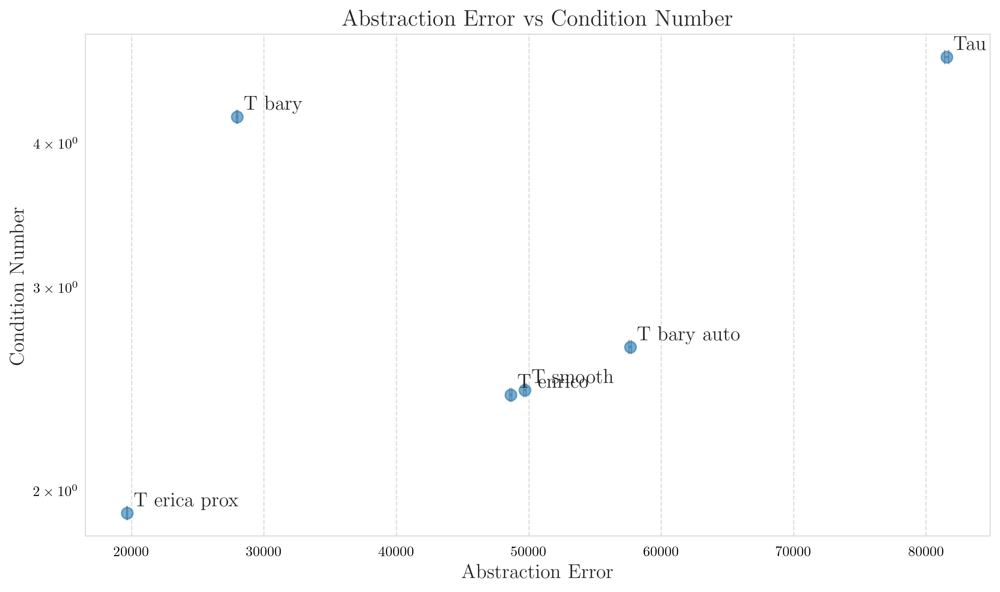


Method		Abstraction Error	Condition Number
--------------------------------------------------
T_erica_prox     19671.768 ± 32.797	     1.908
T_bary           27979.214 ± 54.886	     4.206
T_enrico         48641.012 ± 79.749	     2.415
T_smooth         49713.685 ± 81.456	     2.438
T_bary_auto      57666.496 ± 94.349	     2.657
Tau              81571.645 ± 154.830	     4.739


In [183]:
# Create lists to store the values
methods_list = list(methods.keys())
abstraction_errors = [final_abstraction_error[method][0] for method in methods_list]  # Get mean errors
error_bars = [final_abstraction_error[method][1] for method in methods_list]  # Get confidence intervals
condition_numbers = [condition_nums[method] for method in methods_list]

# Create the scatter plot
plt.figure(figsize=(10, 6))

# Plot points with error bars
plt.errorbar(abstraction_errors, condition_numbers, 
            xerr=error_bars,
            fmt='o',  # Point marker
            alpha=0.6,
            capsize=5,  # Add caps to error bars
            ecolor='gray',  # Error bar color
            markersize=8)

# Add labels for each point
for i, method in enumerate(methods_list):
    plt.annotate(method.replace('_', ' '), 
                (abstraction_errors[i], condition_numbers[i]),
                xytext=(5, 5), textcoords='offset points')

# Add labels and title
plt.xlabel('Abstraction Error')
plt.ylabel('Condition Number')
plt.title('Abstraction Error vs Condition Number')

# Add grid
plt.grid(True, linestyle='--', alpha=0.7)

# Optional: Set log scale for y-axis if condition numbers vary widely
plt.yscale('log')

# Adjust layout to prevent label clipping
plt.tight_layout()

plt.show()

# Create sorted list of methods based on abstraction error
sorted_methods = sorted(methods_list, key=lambda x: final_abstraction_error[x][0])

# Print table header
print("\nMethod\t\tAbstraction Error\tCondition Number")
print("-" * 50)

# Print sorted results with confidence intervals
for method in sorted_methods:
    mean_error = final_abstraction_error[method][0]
    ci = final_abstraction_error[method][1]
    print(f"{method:<15} {mean_error:>10.3f} ± {ci:>6.3f}\t{condition_nums[method]:>10.3f}")

In [152]:
condition_nums

{'T_erica_prox': nan,
 'T_enrico': 2.4150138,
 'T_bary': 4.3824267,
 'T_bary_auto': 2.5614655,
 'T_smooth': 2.4253151,
 'Tau': 4.738720018687272}

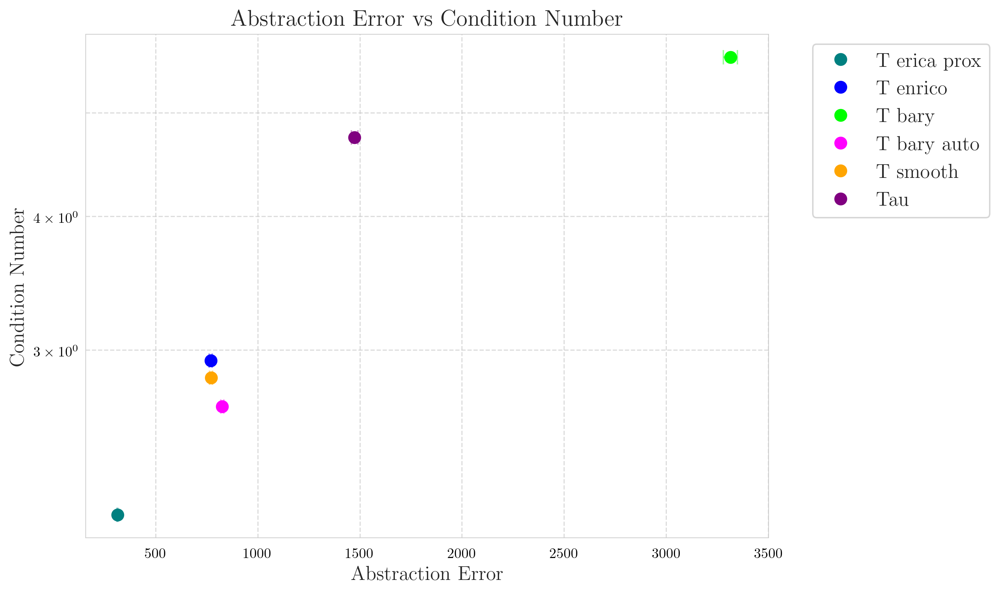


Method		Abstraction Error	Condition Number
--------------------------------------------------
T_erica_prox       313.338 ±  2.774	     2.104
T_enrico           769.891 ±  7.602	     2.932
T_smooth           771.499 ±  7.483	     2.825
T_bary_auto        826.524 ±  7.763	     2.657
Tau               1474.676 ± 15.884	     4.739
T_bary            3314.527 ± 34.778	     5.634


In [120]:
# Create lists to store the values
methods_list = list(methods.keys())
abstraction_errors = [final_abstraction_error[method][0] for method in methods_list]  # Get mean errors
error_bars = [final_abstraction_error[method][1] for method in methods_list]  # Get confidence intervals
condition_numbers = [condition_nums[method] for method in methods_list]

# Create the scatter plot
plt.figure(figsize=(10, 6))

# Use a more vibrant color palette
colors = [
    '#008080',  # Teal
    '#0000FF',  # Blue
    '#00FF00',  # Green
    '#FF00FF',  # Magenta
    '#FFA500',  # Orange
    '#800080',  # Purple
    '#FF0000',  # Red
    '#FFD700',  # Gold
][:len(methods_list)]  # Take only as many colors as we have methods

# Plot error bars first (without labels)
for i, method in enumerate(methods_list):
    plt.errorbar(abstraction_errors[i], condition_numbers[i], 
                xerr=error_bars[i],
                fmt='none',  # No marker for error bars
                capsize=5,
                ecolor=colors[i],
                alpha=0.4)

# Plot points separately with labels for legend
for i, method in enumerate(methods_list):
    plt.plot(abstraction_errors[i], condition_numbers[i], 
            'o',  # Point marker
            color=colors[i],
            markersize=8,
            label=method.replace('_', ' '))

# Add labels and title
plt.xlabel('Abstraction Error')
plt.ylabel('Condition Number')
plt.title('Abstraction Error vs Condition Number')

# Add grid with both vertical and horizontal lines
plt.grid(True, linestyle='--', alpha=0.7, which='both', axis='both')

# Set log scale for y-axis
plt.yscale('log')

# Add legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent legend clipping
plt.tight_layout()

plt.show()

# Print table of results
print("\nMethod\t\tAbstraction Error\tCondition Number")
print("-" * 50)

# Print sorted results with confidence intervals
sorted_methods = sorted(methods_list, key=lambda x: final_abstraction_error[x][0])
for method in sorted_methods:
    mean_error = final_abstraction_error[method][0]
    ci = final_abstraction_error[method][1]
    print(f"{method:<15} {mean_error:>10.3f} ± {ci:>6.3f}\t{condition_nums[method]:>10.3f}")

In [30]:
# # Define the grid of noise radii to test
# radius_values = [.2, .5, 1, 2]

# # Initialize matrix to store results
# error_matrix = np.zeros((len(radius_values), len(radius_values)))
# std_matrix = np.zeros((len(radius_values), len(radius_values)))

# # Test each combination of noise radii
# for i, radiusL in enumerate(radius_values):
#     for j, radiusH in enumerate(radius_values):
#         print(f"Testing radiusL={radiusL}, radiusH={radiusH}")
        
#         # Evaluate abstraction error
#         abstraction_errors = []
#         for _ in tqdm(range(num_iter)):
#             noiseL = evut.generate_noise(data[None][0], noise_typeL, 'L', experiment, 
#                                        normalize=False, random_range=noise_range, rad=radiusL)
#             noiseH = evut.generate_noise(data[None][1], noise_typeH, 'H', experiment, 
#                                        normalize=False, random_range=noise_range, rad=radiusH)
            
#             total_error = 0
#             for iota in Ill:
#                 base, abst = data[iota]
#                 if add_noiseL:
#                     base = base + noiseL
#                 if add_noiseH:
#                     abst = abst #+ noiseH
                    
#                 total_error += evut.compute_abstraction_error(T_erica_prox, base, abst, metric)
                            
#             iter_avg = total_error / len(Ill)
#             abstraction_errors.append(iter_avg)
        
#         # Store results
#         error_matrix[i, j] = np.mean(abstraction_errors)
#         std_matrix[i, j] = np.std(abstraction_errors)

# # Create heatmap for mean errors
# plt.figure(figsize=(10, 8))
# sns.heatmap(error_matrix, 
#             xticklabels=radius_values,
#             yticklabels=radius_values,
#             annot=True,
#             fmt='.3f',
#             cmap='YlOrRd')
# plt.xlabel('Radius H')
# plt.ylabel('Radius L')
# plt.title('Abstraction Error vs Noise Radii')
# plt.show()

# # Find best combination
# min_idx = np.unravel_index(np.argmin(error_matrix), error_matrix.shape)
# print("\nBest radius combination:")
# print(f"RadiusL: {radius_values[min_idx[0]]}, RadiusH: {radius_values[min_idx[1]]}")
# print(f"Mean error: {error_matrix[min_idx]:.4f} ± {std_matrix[min_idx]*1.96:.4f}")

In [31]:
# # Test increasing values of epsilon and delta together
# epsilons_deltas = [.1, .5, 1, 2, 5, 10]  # Test matching pairs of epsilon/delta values
# errors = np.zeros((len(epsilons_deltas), len(epsilons_deltas)))  # Initialize error storage matrix
# results = []  # Store detailed results

# for i, epsilon in enumerate(epsilons_deltas):
#     for j, delta in enumerate(epsilons_deltas):
        
#         # Evaluate abstraction error
#         abstraction_error = []
#         for _ in tqdm(range(num_iter)):
#             noiseL = evut.generate_noise(data[None][0], noise_typeL, 'L', experiment, normalize=False, random_range=noise_range, rad=epsilon)
#             noiseH = evut.generate_noise(data[None][1], noise_typeH, 'H', experiment, normalize=False, random_range=noise_range, rad=delta)
            
#             total = 0
#             for iota in Ill:
#                 base, abst = data[iota]
#                 if add_noiseL:
#                     base = base + noiseL
#                 if add_noiseH:
#                     abst = abst + noiseH
                    
#                 total += evut.compute_abstraction_error(T_erica_prox, base, abst, metric)
                            
#             iter_avg = total / len(Ill)
#             abstraction_error.append(iter_avg)
        
#         mean_error = np.mean(abstraction_error)
#         std_error = np.std(abstraction_error)
        
#         # Store the results
#         errors[i,j] = mean_error  # Store in matrix for heatmap
#         results.append({          # Store detailed results
#             'epsilon': epsilon,
#             'delta': delta,
#             'mean_error': mean_error,
#             'std_error': std_error,
#             'confidence_interval': std_error * 1.96
#         })
        
#         print(f"Average abstraction error: {mean_error:.4f} ± {std_error*1.96:.4f}\n")

# # Create heatmap
# plt.figure(figsize=(10, 8))
# sns.heatmap(errors, 
#             xticklabels=epsilons_deltas,
#             yticklabels=epsilons_deltas,
#             annot=True,
#             fmt='.3f',
#             cmap='YlOrRd')
# plt.xlabel('Delta')
# plt.ylabel('Epsilon')
# plt.title('Abstraction Error vs Epsilon-Delta Values')
# plt.show()

# # Line plot for diagonal values (where epsilon = delta)
# plt.figure(figsize=(8, 6))
# diagonal_errors = [errors[i,i] for i in range(len(epsilons_deltas))]
# plt.plot(epsilons_deltas, diagonal_errors, marker='o')
# plt.xlabel('Epsilon = Delta')
# plt.ylabel('Abstraction Error')
# plt.title('Abstraction Error vs Matching Epsilon-Delta Values')
# plt.grid(True)
# plt.show()

# # Optional: Save results
# results_df = pd.DataFrame(results)
# results_df.to_csv('epsilon_delta_results.csv', index=False)

# # Print best combination
# best_result = min(results, key=lambda x: x['mean_error'])
# print("\nBest parameter combination:")
# print(f"Epsilon: {best_result['epsilon']}, Delta: {best_result['delta']}")
# print(f"Mean error: {best_result['mean_error']:.4f} ± {best_result['confidence_interval']:.4f}")

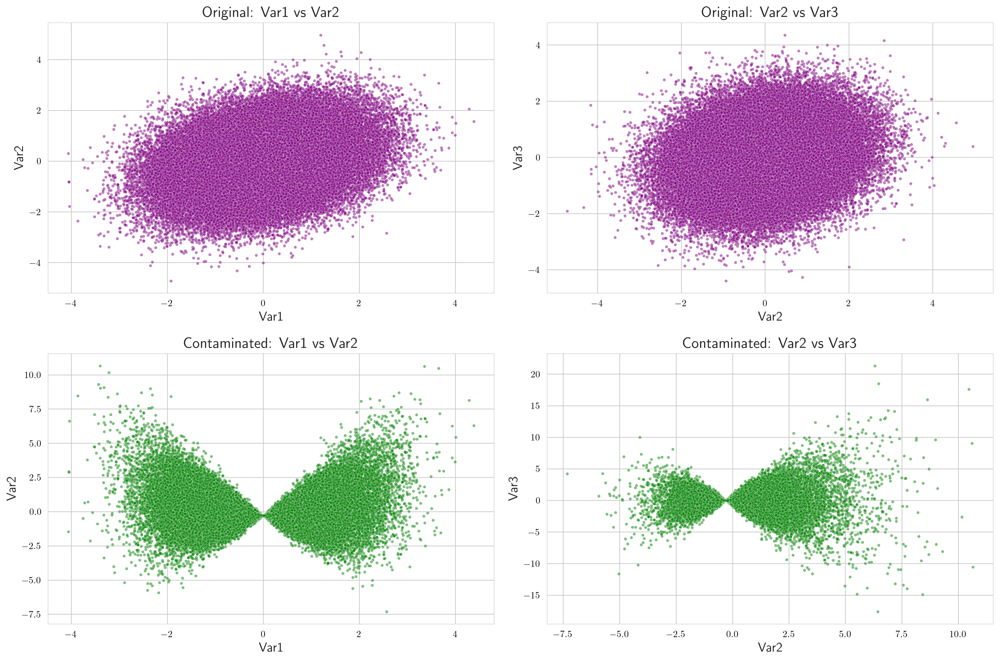

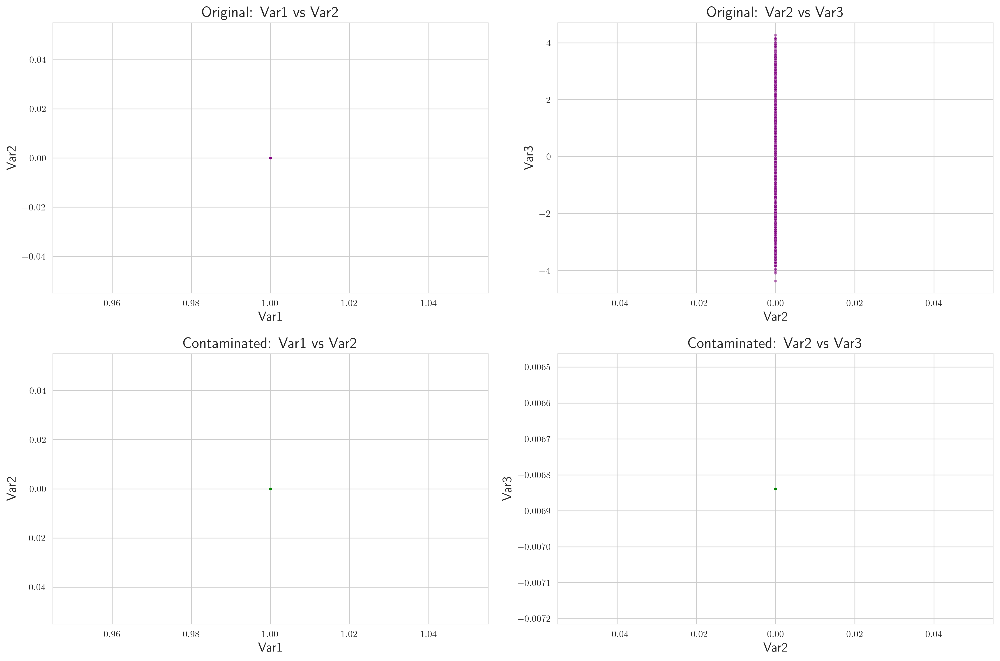

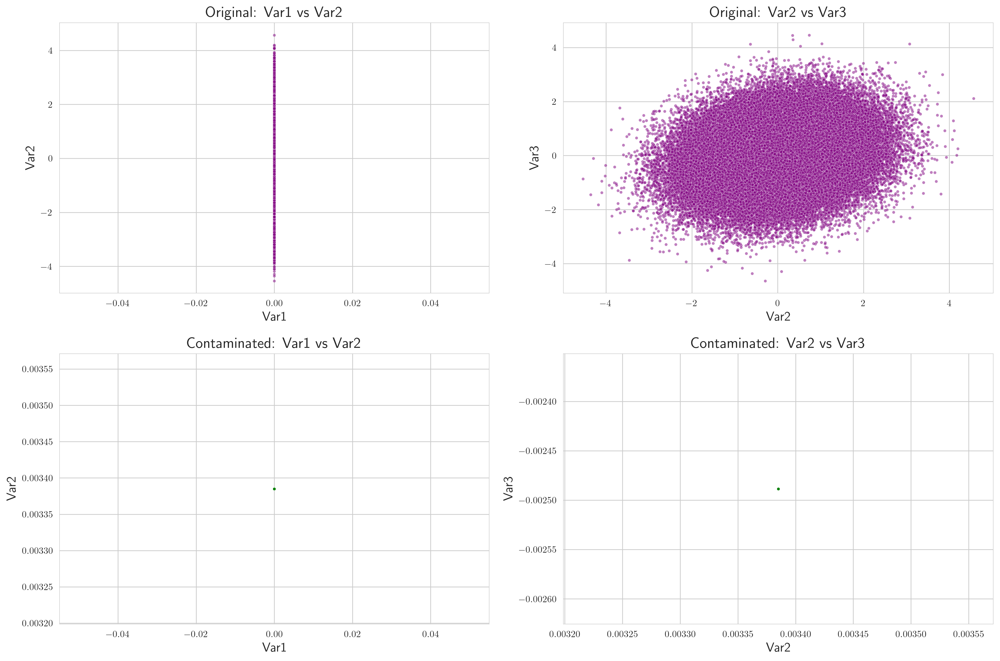

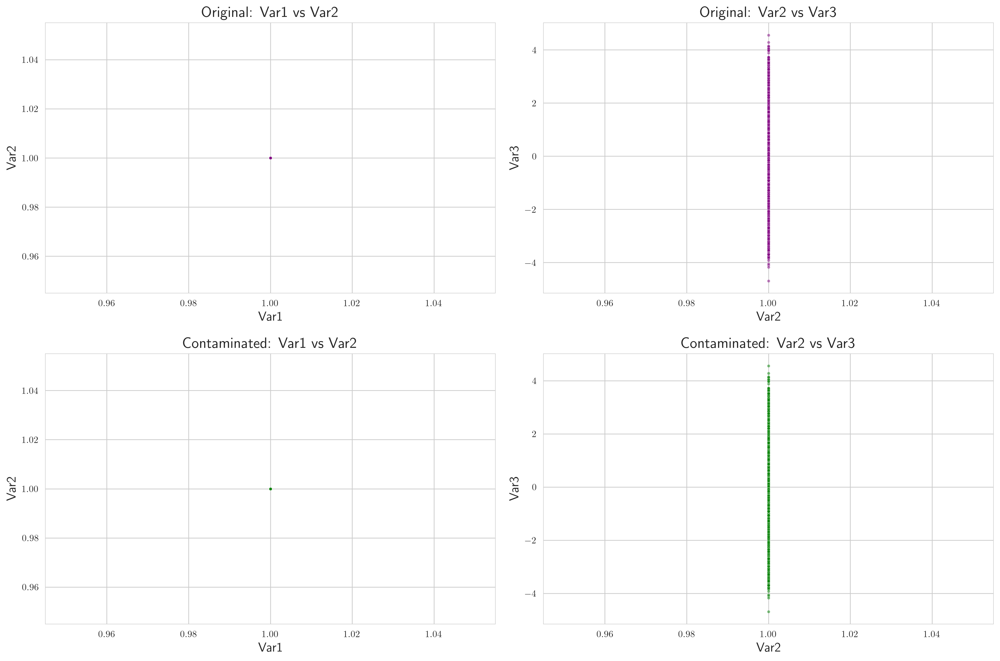

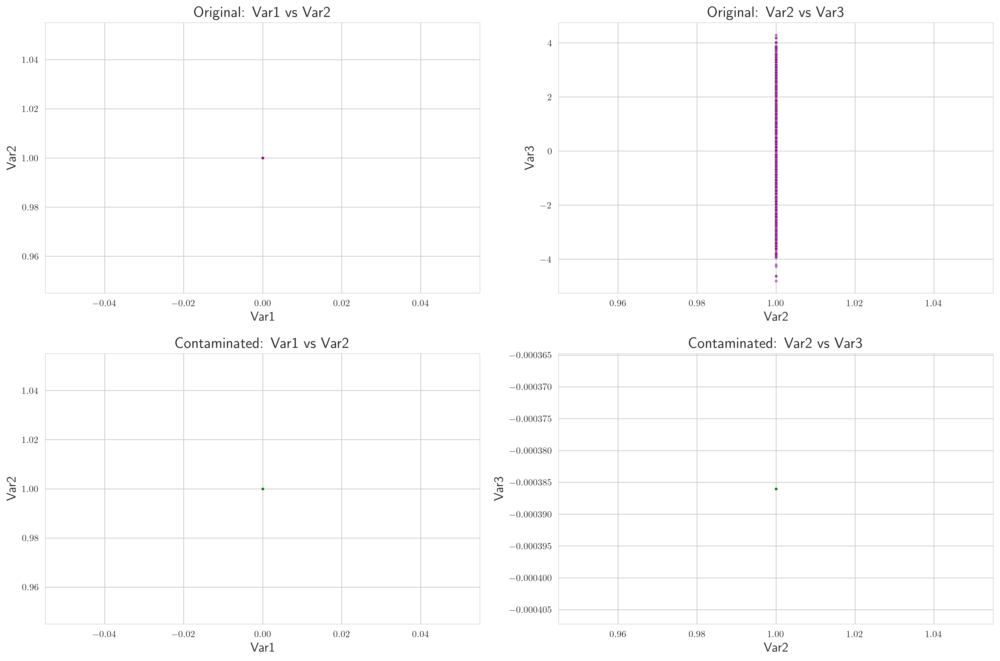

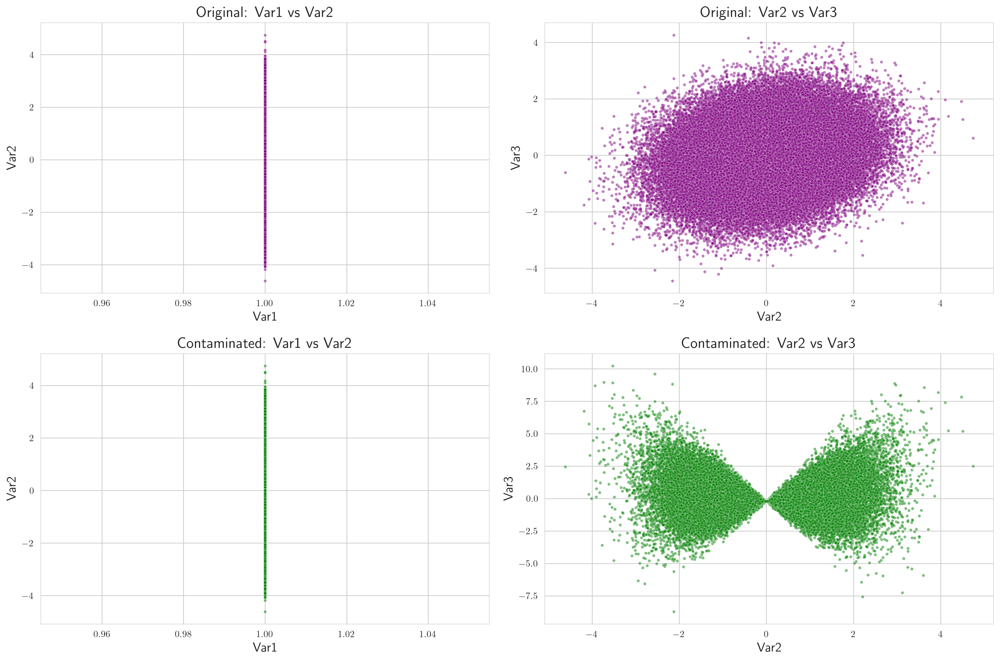

In [184]:
for iota in Ill:
    base, abst = data[iota]
    #Add noise
    # base = evut.add_random_noise(base, noise_typeL, 'L')
    # abst = evut.add_random_noise(abst, noise_typeH, 'H')

    #Linear contamination
    base_c = evut.contaminate_linear_relationships(base, contamination_fraction=1, contamination_type='multiplicative')
    #abst_c = evut.contaminate_linear_relationships(abst, contamination_fraction=1, contamination_type='multiplicative')

    evut.plot_contamination_effects(base, base_c)
    print( )

### Plot Gaussian shift effects

In [33]:
# for iota in Ill:
#     base, abst = data[iota]
#     noisy_base = evut.add_random_noise(base, noise_typeL, 'L')
#     evut.plot_distribution_shifts(base, noisy_base)#, f"Base Level Gaussian Shift - {noise_typeL}")
#     print( )

### Plot Noise addition and linear contamination effects


In [32]:
# for iota in Ill:
#     base, abst = data[iota]
#     #Add noise
#     # base = evut.add_random_noise(base, noise_typeL, 'L')
#     # abst = evut.add_random_noise(abst, noise_typeH, 'H')

#     #Linear contamination
#     base_c = evut.contaminate_linear_relationships(base, contamination_fraction=1, contamination_type='multiplicative')
#     #abst_c = evut.contaminate_linear_relationships(abst, contamination_fraction=1, contamination_type='multiplicative')

#     evut.plot_contamination_effects(base, base_c)
#     print( )


## Structurally generated Gaussians (REVISE THIS!!)

In [34]:
for name, T in methods.items(): 
    all_errors = []  
    avg_error = 0
    
    for _ in range(num_iter):
        total = 0
        for iota in Ill:
            L_i = LLmodels[iota]._compute_reduced_form()
            V_i = T @ L_i
            H_i = HLmodels[omega[iota]]._compute_reduced_form()
            muV    = V_i @ params_Lerica_prox['mu_U']
            sigmaV = V_i @ params_Lerica_prox['Sigma_U'] @ V_i.T
            muH    = H_i @ params_Herica_prox['mu_U']
            sigmaH = H_i @ params_Herica_prox['Sigma_U'] @ H_i.T

            dist = mut.compute_wasserstein(muV, sigmaV, muH, sigmaH)

            total += dist

        iter_avg_ = total/len(Ill)
        all_errors.append(iter_avg_)  
 
    mean_e = np.mean(all_errors)
    std_e  = np.std(all_errors)
    print(f"Average e(τ) for {name}: {mean_e:.6f} ± {std_e*1.96:.5f}")  

Average e(τ) for T_erica_prox: 0.473676 ± 0.00000
Average e(τ) for T_enrico: 2.644790 ± 0.00000
Average e(τ) for T_random: 4.559878 ± 0.00000
Average e(τ) for T_random2: 14.405817 ± 0.00000
Average e(τ) for T_bary: 8.339125 ± 0.00000
Average e(τ) for T_bary_auto: 2.715501 ± 0.00000
Average e(τ) for T_smooth: 2.604802 ± 0.00000
Average e(τ) for Tau: 6.110560 ± 0.00000


In [ ]:
params_erica =  {
                    'theta_hatL': theta_hatL,
                    'theta_hatH': theta_hatH,
                    'initial_theta': 'empirical',
                    'epsilon': epsilon,
                    'delta': delta,
                    'lambda_L': lambda_L,
                    'lambda_H': lambda_H,
                    'lambda_param_L': lambda_param_L,
                    'lambda_param_H': lambda_param_H,
                    'xavier': xavier, 
                    'project_onto_gelbrich': project_onto_gelbrich, 
                    'eta_max': eta_max,
                    'eta_min': eta_min,
                    'max_iter': max_iter,
                    'num_steps_min': num_steps_min,
                    'num_steps_max': num_steps_max,
                    'proximal_grad': proximal_grad,
                    'tol': tol,
                    'seed': seed,
                    'robust_L': robust_L,
                    'robust_H': robust_H,
                    'grad_clip': grad_clip,
                    'plot_steps': plot_steps,
                    'plot_epochs': plot_epochs,
                    'display_results': display_results
                }

In [77]:
for epsilon in [.5, 1, 5, 10]:
    for delta in [.5, 1, 5, 10]:
        print(f"Epsilon: {epsilon}, Delta: {delta}")
        params_erica =  {
                            'theta_hatL': theta_hatL,
                            'theta_hatH': theta_hatH,
                            'initial_theta': 'empirical',
                            'epsilon': epsilon,
                            'delta': delta,
                            'lambda_L': .9,
                            'lambda_H': .9,
                            'lambda_param_L': .3, 
                            'lambda_param_H': .3,
                            'xavier': False, #If xavier is true, we need to project onto the Gelbrich ball!
                            'project_onto_gelbrich': True,
                            'eta_max': 0.001,
                            'eta_min': 0.001,
                            'max_iter': 10,
                            'num_steps_min': 5,
                            'num_steps_max': 3,
                            'proximal_grad': True,
                            'tol': 1e-5,
                            'seed': seed,
                            'robust_L': True,
                            'robust_H': True,
                            'plot_steps': False,
                            'plot_epochs': False,
                            'display_results': False
                        }

        params_Lerica, params_Herica, T_erica_prox, inobjs, epobjs, condition_num_list = run_optimization(**params_erica)
        type_to_params = {
                     'gelbrich_gaussian': {
                           'L': theta_hatL,
                           'H': theta_hatH
                     },
                     
                     'boundary_gaussian': {
                           'L': params_Lerica,
                           'H': params_Herica
                     }
                 }

        joblib.dump(type_to_params, f"data/{experiment}/type_to_params.pkl")
        method_names      = ['ERiCA']
        methods           = [T_erica]
        abstraction_error = {name: [] for name in method_names}

        # Outer loop: number of noise sampling iterations
        for iter_num in tqdm(range(num_iter)): # desc="Noise sampling iterations"
            
            noiseL = evut.generate_noise(data[None][0], noise_typeL, 'L', experiment, normalize=False, random_range=noise_range)
            noiseH = evut.generate_noise(data[None][1], noise_typeH, 'H', experiment, normalize=False, random_range=noise_range)
            
            # For this noise iteration, evaluate each method
            for i, T in enumerate(methods):
                total = 0
                start_time = time.time()
            
                # Compute average error over Ill for this method
                for iota in Ill:
                    # Get base data and add noise
                    base, abst = data[iota]
                    
                    if add_noiseL:
                        base = base + noiseL # + base 
                    if add_noiseH:
                        abst = abst + noiseH # + abst
                        
                    if lin_contaminationL:
                        base = evut.contaminate_linear_relationships(base, contamination_fraction=cont_fracL, contamination_type=cont_type)
                    if lin_contaminationH:
                        abst = evut.contaminate_linear_relationships(abst, contamination_fraction=cont_fracH, contamination_type=cont_type)
                    
                    tau_base   = base @ T.T
                    tau_muL    = np.mean(tau_base, axis=0)
                    tau_sigmaL = np.cov(tau_base, rowvar=False)
                    muH        = np.mean(abst, axis=0)
                    sigmaH     = np.cov(abst, rowvar=False)
                    
                    if metric == 'wass':
                        dist = mut.compute_wasserstein(tau_muL, tau_sigmaL, muH, sigmaH)
                    else:  # metric == 'js'
                        dist = mut.compute_jensenshannon(tau_base, abst)
                        
                    total += dist
                    
                iter_avg = total / len(Ill)
                abstraction_error[method_names[i]].append(iter_avg)
            
        # Compute final statistics
        final_abstraction_error = {}
        for name in method_names:
            mean_e = np.mean(abstraction_error[name])
            std_e = np.std(abstraction_error[name])
            final_abstraction_error[name] = (mean_e, std_e * 1.96)
            print(f"Average e(τ) for {name}: {mean_e:.2f} ± {std_e:.3f}\n")

Epsilon: 0.5, Delta: 0.5


  0%|          | 0/10 [00:00<?, ?it/s]/var/folders/vn/9swzhgj513q7n9gd_4vsbd840000gn/T/ipykernel_45367/4025087366.py:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mu_L    = torch.tensor(mu_L, requires_grad=True)
/var/folders/vn/9swzhgj513q7n9gd_4vsbd840000gn/T/ipykernel_45367/4025087366.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mu_H    = torch.tensor(mu_H, requires_grad=True)
/var/folders/vn/9swzhgj513q7n9gd_4vsbd840000gn/T/ipykernel_45367/4025087366.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Sigma_L = torch.tensor(S

Average e(τ) for ERiCA: 4.71 ± 0.014

Epsilon: 0.5, Delta: 1


100%|██████████| 10/10 [00:00<00:00, 16.73it/s]


Average e(τ) for ERiCA: 4.71 ± 0.011

Epsilon: 0.5, Delta: 5


100%|██████████| 10/10 [00:00<00:00, 16.43it/s]


Average e(τ) for ERiCA: 4.71 ± 0.015

Epsilon: 0.5, Delta: 10


100%|██████████| 10/10 [00:00<00:00, 15.57it/s]


Average e(τ) for ERiCA: 4.71 ± 0.013

Epsilon: 1, Delta: 0.5


100%|██████████| 10/10 [00:00<00:00, 14.10it/s]


Average e(τ) for ERiCA: 4.71 ± 0.018

Epsilon: 1, Delta: 1


100%|██████████| 10/10 [00:00<00:00, 16.11it/s]


Average e(τ) for ERiCA: 4.71 ± 0.015

Epsilon: 1, Delta: 5


100%|██████████| 10/10 [00:00<00:00, 16.77it/s]


Average e(τ) for ERiCA: 4.70 ± 0.017

Epsilon: 1, Delta: 10


100%|██████████| 10/10 [00:00<00:00, 16.85it/s]


Average e(τ) for ERiCA: 4.71 ± 0.009

Epsilon: 5, Delta: 0.5


100%|██████████| 10/10 [00:00<00:00, 16.83it/s]


Average e(τ) for ERiCA: 4.71 ± 0.014

Epsilon: 5, Delta: 1


100%|██████████| 10/10 [00:00<00:00, 16.90it/s]


Average e(τ) for ERiCA: 4.71 ± 0.017

Epsilon: 5, Delta: 5


100%|██████████| 10/10 [00:00<00:00, 10.66it/s]


Average e(τ) for ERiCA: 4.71 ± 0.015

Epsilon: 5, Delta: 10


100%|██████████| 10/10 [00:00<00:00, 15.48it/s]


Average e(τ) for ERiCA: 4.71 ± 0.010

Epsilon: 10, Delta: 0.5


100%|██████████| 10/10 [00:00<00:00, 16.27it/s]


Average e(τ) for ERiCA: 4.71 ± 0.014

Epsilon: 10, Delta: 1


100%|██████████| 10/10 [00:00<00:00, 15.54it/s]


Average e(τ) for ERiCA: 4.71 ± 0.012

Epsilon: 10, Delta: 5


100%|██████████| 10/10 [00:00<00:00, 16.03it/s]


Average e(τ) for ERiCA: 4.71 ± 0.015

Epsilon: 10, Delta: 10


100%|██████████| 10/10 [00:00<00:00, 14.78it/s]

Average e(τ) for ERiCA: 4.71 ± 0.010

